In [8]:
pip install config

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install albumentations

Note: you may need to restart the kernel to use updated packages.


In [12]:
import numpy as np
import os
import config
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torchvision.utils import save_image, make_grid
from tqdm import tqdm
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import cv2
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import seaborn as sns
import albumentations as A
import albumentations.pytorch as Ap
%matplotlib inline

In [13]:
#Полезные функции которые пригодятся нам в процессе обучения

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Функция для отрисовки картинок: на входе тензор картинок, число картинок и размер изображений.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

def save_some_examples(gen, val_loader, epoch, folder):
    '''
    Функция для отрисовки и сохранения примеров картинок 
    '''
    
    x, y = next(iter(val_loader))
    x, y = x.to(DEVICE), y.to(DEVICE)
    
    gen.eval()
    with torch.no_grad():
        y_fake = gen(x)
        y_fake = y_fake * 0.5 + 0.5  # remove normalization#
        print('Real_image')
        show_tensor_images(x, num_images=1, size=(3, 256, 256), nrow=1, show=True)
        print('Expected')
        show_tensor_images(y, num_images=1, size=(3, 256, 256), nrow=1, show=True)
        print('Prediction')
        show_tensor_images(y_fake, num_images=1, size=(3, 256, 256), nrow=1, show=True)
        save_image(y_fake, folder + f"/generated_at_{epoch}_epoch.png")
        save_image(x * 0.5 + 0.5, folder + f"/inputed_at_{epoch}_epoch.png")
        if epoch == 1:
            save_image(y * 0.5 + 0.5, folder + f"/label_{epoch}.png")
    gen.train()


def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    
    '''
    Функция для сохранения весов модели
    '''
    
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    '''
    Функция для загрузки предобученных весов модели
    '''
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr
        
        
def display_results(x, y, y_hat, path: str,figsize=(10,5)):
    '''
    Функция для отображения промежуточных результатов в процессе обучения
    '''
    x = x.detach().cpu().permute(1, 2, 0)
    y = y.detach().cpu().permute(1, 2, 0)
    y_hat = y_hat.detach().cpu().permute(1, 2, 0)
    
    x, y, y_hat = x.float(), y.float(), y_hat.float()
    
    images = [x, y, y_hat]
    titles = ['input','real','generated']
    
    fig, ax = plt.subplots(1, 3, figsize=figsize)
    for idx,img in enumerate(images):
        ax[idx].imshow(img)
        ax[idx].axis("off")
    for idx, title in enumerate(titles):    
        ax[idx].set_title('{}'.format(title))
    plt.savefig(path)
    plt.show()

In [80]:
#Трансформации, которые мы будем делать с входным изображением
#Тк изображение на входе содержит в себе и снимок спутника и карточный вид, мы его впоследствии разделим на 2: 
# Изображение со спутника будет называться image, а целевая картинка - image0

both_transform = A.Compose(
    [A.Resize(width=256, height=256),], additional_targets={"image0": "image"},
)


transform_only_input = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        #A.ColorJitter (brightness=0.7, contrast=0.7, saturation=0.7, always_apply=False, p=0.5),
        Ap.ToTensorV2(),
    ]
)

transform_only_mask = A.Compose(
    [
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        Ap.ToTensorV2(),
    ]
)

In [15]:
class MapDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.list_files = os.listdir(self.root_dir)

    def __len__(self):
        return len(self.list_files)

    def __getitem__(self, index):
        img_file = self.list_files[index]
        img_path = os.path.join(self.root_dir, img_file)
        image = np.array(Image.open(img_path))
        input_image = image[:, :600, :]
        target_image = image[:, 600:, :]

        augmentations = both_transform(image=input_image, image0=target_image)
        input_image = augmentations["image"]
        target_image = augmentations["image0"]

        input_image = transform_only_input(image=input_image)["image"]
        target_image = transform_only_mask(image=target_image)["image"]

        return input_image, target_image



In [23]:
class DownBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        use_norm: bool = True,
        last_layer: bool = False
    ):
        super().__init__()
        stride = 1 if last_layer else 2
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=False, padding_mode="reflect" ),
            nn.BatchNorm2d(out_channels) if use_norm else nn.Identity(),
            nn.LeakyReLU(0.2)
        )
        
    def forward(self,x):
        x = self.conv(x)
        return x
       
        

In [39]:
class UpBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        use_norm: bool = True,
        last_layer: bool = False,
        use_dropout: bool = False
    ):
        super().__init__()
        self.conv = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_channels) if use_norm else nn.Identity(),
            nn.ReLU()
        )
        self.use_dropout = use_dropout
        self.drop = nn.Dropout(0.5)
        
    def forward(self,x):
        x = self.conv(x)
        return self.drop(x) if self.use_dropout else x
       
        

In [24]:
class Discriminator(nn.Module):
    def __init__(self, in_channels: int=3):
        super().__init__()
        self.down1 = DownBlock(in_channels*2, 64, use_norm=False)
        self.down2 = DownBlock(64, 128)
        self.down3 = DownBlock(128, 256)
        self.down4 = DownBlock(256, 512, last_layer=True)
        self.final = nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect")
        
    def forward(self, x, y):
        x = torch.cat([x, y], dim=1)
        x = self.down1(x)
        x = self.down2(x)
        x = self.down3(x)
        x = self.down4(x)
        x = self.final(x)
        return x

In [25]:
def test():
    x = torch.randn((1, 3, 256, 256))
    y = torch.randn((1, 3, 256, 256))
    model = Discriminator()
    preds = model(x, y)
    print(model)
    print(preds.shape)
    
test()

Discriminator(
  (down1): DownBlock(
    (conv): Sequential(
      (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
      (1): Identity()
      (2): LeakyReLU(negative_slope=0.2)
    )
  )
  (down2): DownBlock(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
  )
  (down3): DownBlock(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
  )
  (down4): DownBlock(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False, padding_mode=ref

In [40]:
class Generator(nn.Module):
    def __init__(self, in_channels: int=3):
        super().__init__()
        self.input_channels = input_channels
        self.down1 = DownBlock(input_channels, 64, use_norm=False)
        self.down2 = DownBlock(64, 128)
        self.down3 = DownBlock(128, 256)
        self.down4 = DownBlock(256, 512)
        self.down5 = DownBlock(512, 512)
        self.down6 = DownBlock(512, 512)
        self.down7 = DownBlock(512, 512)
        
        self.bottleneck = nn.Sequential(
                          nn.Conv2d(512, 512, 4, 2, 1),
                          nn.ReLU()
        )
        
        self.up1 = UpBlock(512, 512, use_dropout=True)
        self.up2 = UpBlock(1024, 512, use_dropout=True)
        self.up3 = UpBlock(1024, 512, use_dropout=True)
        self.up4 = UpBlock(1024, 512)
        self.up5 = UpBlock(1024, 256)
        self.up6 = UpBlock(512, 128)
        self.up7 = UpBlock(256, 64)
        self.up8 = nn.Sequential(
                   nn.ConvTranspose2d(128, input_channels, 4, 2, 1),
                   nn.Tanh()
        )
        
    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        
        bt = self.bottleneck(d7)
        
        up1 = self.up1(bt)
        up2 = self.up2(torch.concat([up1, d7], dim=1))
        up3 = self.up3(torch.concat([up2, d6], dim=1))
        up4 = self.up4(torch.concat([up3, d5], dim=1))
        up5 = self.up5(torch.concat([up4, d4], dim=1))
        up6 = self.up6(torch.concat([up5, d3], dim=1))
        up7 = self.up7(torch.concat([up6, d2], dim=1))
        up8 = self.up8(torch.concat([up7, d1], dim=1))
        return up8
        

In [41]:
def test():
    x = torch.randn((1, 3, 256, 256))
    model = Generator()
    preds = model(x)
    print(preds.shape)

test()

torch.Size([1, 3, 256, 256])


In [78]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
TRAIN_DIR = "/kaggle/input/pix2pix-dataset/maps/maps/train/"
VAL_DIR = "/kaggle/input/pix2pix-dataset/maps/maps/val/"
LEARNING_RATE = 2e-4
BATCH_SIZE = 16
NUM_WORKERS = 2
IMAGE_SIZE = 256
CHANNELS_IMG = 3
L1_LAMBDA = 100
LAMBDA_GP = 10
NUM_EPOCHS = 300
LOAD_MODEL = True
SAVE_MODEL = True
CHECKPOINT_DISC = "discriminator.pth.tar"
CHECKPOINT_GEN = "generator.pth.tar"
CHECKPOINT_DISC1 = '/kaggle/input/pix2pix/disc.pth.tar'
CHECKPOINT_GEN1 ='/kaggle/input/pix2pix/gen.pth.tar'

In [43]:
DEVICE

'cuda'

=> Loading checkpoint
=> Loading checkpoint
Epoch 0


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.219, D_real=0.699]

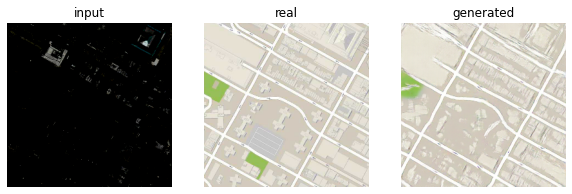

 72%|███████▏  | 50/69 [00:14<00:05,  3.44it/s, D_fake=0.312, D_real=0.403]

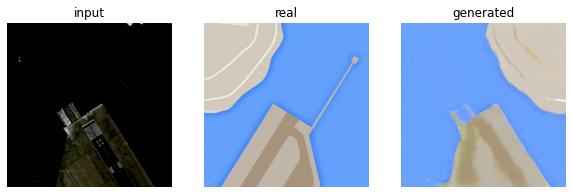

100%|██████████| 69/69 [00:20<00:00,  3.43it/s, D_fake=0.35, D_real=0.567] 


=> Saving checkpoint
=> Saving checkpoint
Epoch 1


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.401, D_real=0.582]

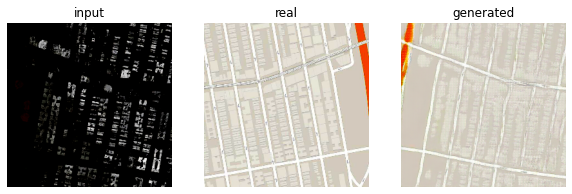

 72%|███████▏  | 50/69 [00:15<00:05,  3.54it/s, D_fake=0.406, D_real=0.716]

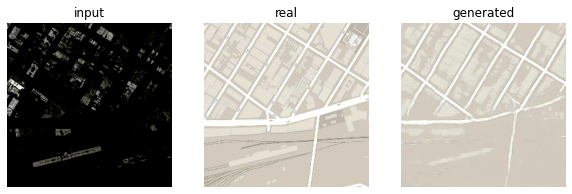

100%|██████████| 69/69 [00:20<00:00,  3.35it/s, D_fake=0.415, D_real=0.769]


Epoch 2


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.584, D_real=0.681]

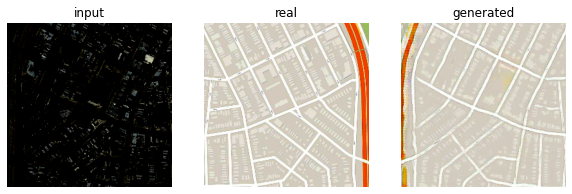

 72%|███████▏  | 50/69 [00:15<00:04,  3.85it/s, D_fake=0.654, D_real=0.376]

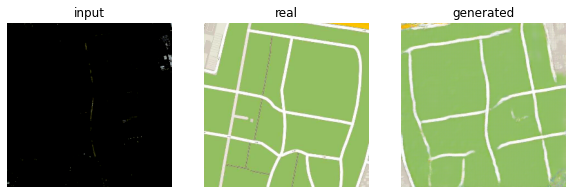

100%|██████████| 69/69 [00:20<00:00,  3.34it/s, D_fake=0.436, D_real=0.502]


Epoch 3


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.329, D_real=0.89]

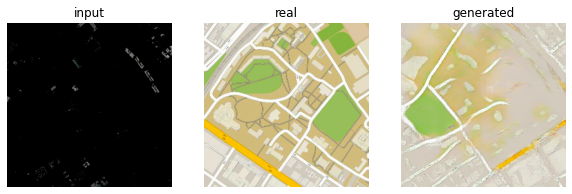

 72%|███████▏  | 50/69 [00:14<00:05,  3.71it/s, D_fake=0.446, D_real=0.257]

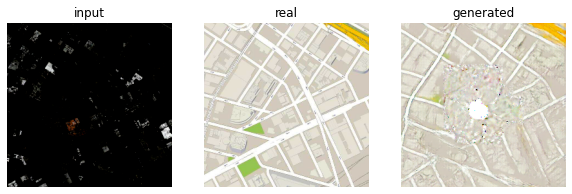

100%|██████████| 69/69 [00:19<00:00,  3.50it/s, D_fake=0.452, D_real=0.528]


Epoch 4


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.313, D_real=0.55]

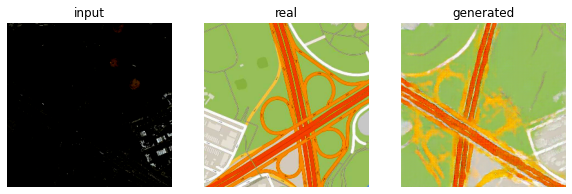

 72%|███████▏  | 50/69 [00:15<00:05,  3.55it/s, D_fake=0.487, D_real=0.566]

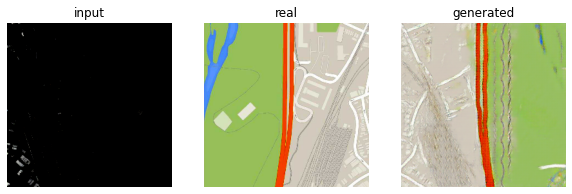

100%|██████████| 69/69 [00:20<00:00,  3.38it/s, D_fake=0.441, D_real=0.325]


Epoch 5


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.371, D_real=0.863]

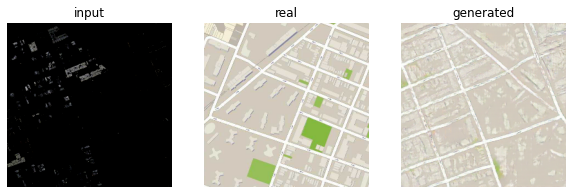

 72%|███████▏  | 50/69 [00:15<00:05,  3.41it/s, D_fake=0.254, D_real=0.864]

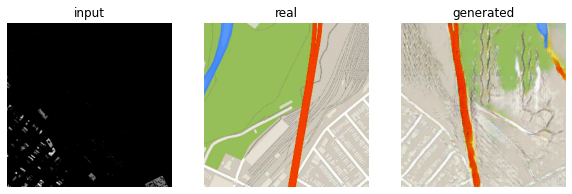

100%|██████████| 69/69 [00:20<00:00,  3.32it/s, D_fake=0.312, D_real=0.64] 


Epoch 6


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.374, D_real=0.488]

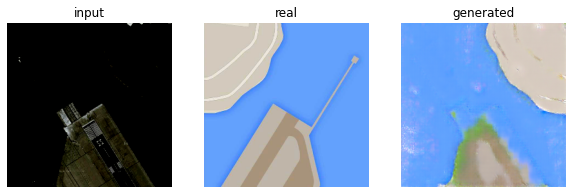

 72%|███████▏  | 50/69 [00:14<00:05,  3.57it/s, D_fake=0.31, D_real=0.493] 

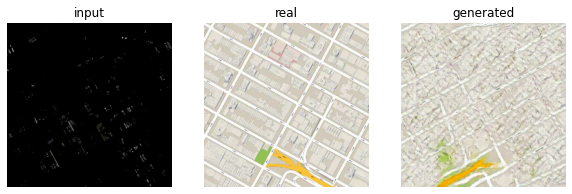

100%|██████████| 69/69 [00:20<00:00,  3.44it/s, D_fake=0.296, D_real=0.504]


Epoch 7


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.435, D_real=0.641]

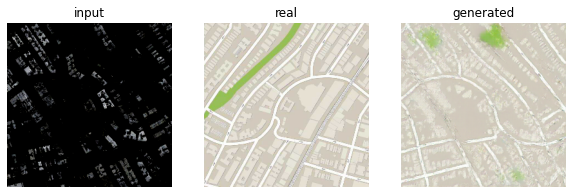

 72%|███████▏  | 50/69 [00:15<00:04,  3.94it/s, D_fake=0.332, D_real=0.401]

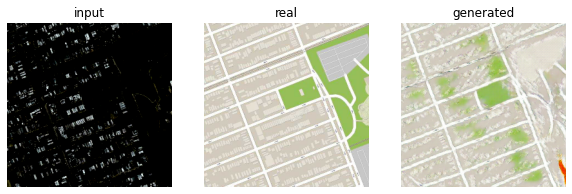

100%|██████████| 69/69 [00:20<00:00,  3.33it/s, D_fake=0.395, D_real=0.701]


Epoch 8


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.385, D_real=0.557]

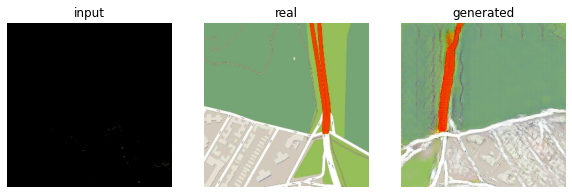

 72%|███████▏  | 50/69 [00:15<00:05,  3.69it/s, D_fake=0.319, D_real=0.632]

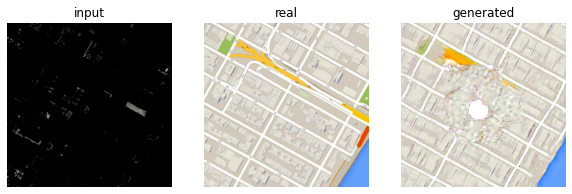

100%|██████████| 69/69 [00:21<00:00,  3.24it/s, D_fake=0.254, D_real=0.48] 


Epoch 9


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.214, D_real=0.703]

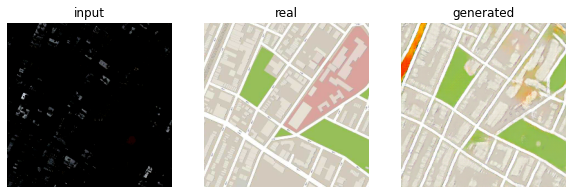

 72%|███████▏  | 50/69 [00:14<00:05,  3.68it/s, D_fake=0.445, D_real=0.42] 

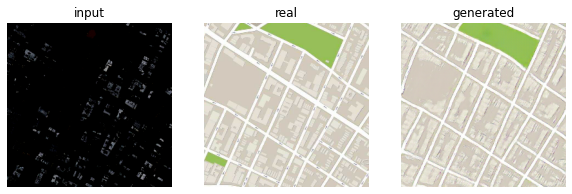

100%|██████████| 69/69 [00:20<00:00,  3.45it/s, D_fake=0.394, D_real=0.799]


Epoch 10


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.332, D_real=0.44]

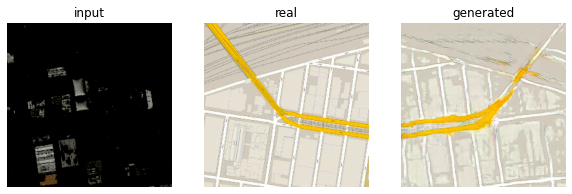

 72%|███████▏  | 50/69 [00:15<00:05,  3.54it/s, D_fake=0.369, D_real=0.426]

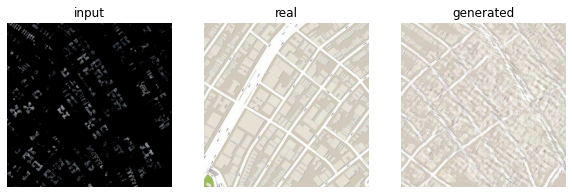

100%|██████████| 69/69 [00:20<00:00,  3.37it/s, D_fake=0.371, D_real=0.494]


Epoch 11


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.366, D_real=0.297]

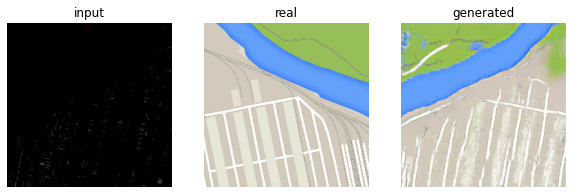

 72%|███████▏  | 50/69 [00:15<00:04,  3.81it/s, D_fake=0.3, D_real=0.609]  

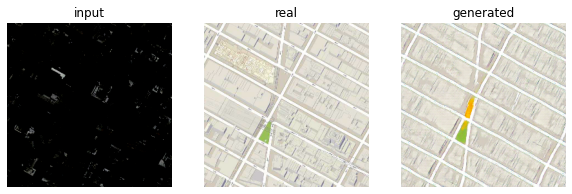

100%|██████████| 69/69 [00:19<00:00,  3.47it/s, D_fake=0.276, D_real=0.76]


Epoch 12


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.395, D_real=0.619]

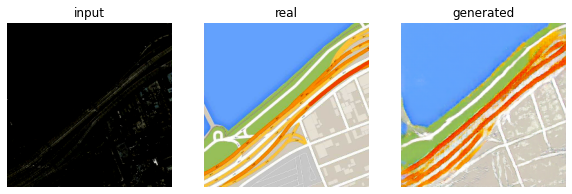

 72%|███████▏  | 50/69 [00:16<00:05,  3.72it/s, D_fake=0.554, D_real=0.738]

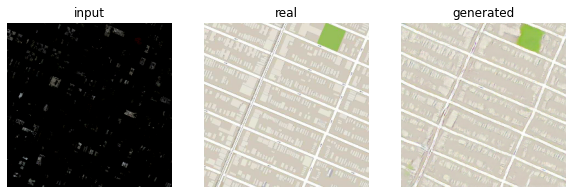

100%|██████████| 69/69 [00:20<00:00,  3.29it/s, D_fake=0.463, D_real=0.629]


Epoch 13


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.364, D_real=0.696]

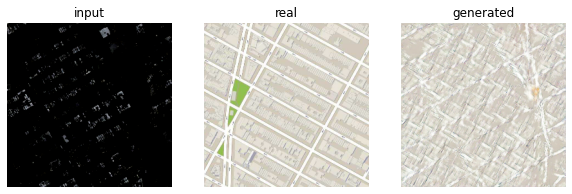

 72%|███████▏  | 50/69 [00:15<00:05,  3.32it/s, D_fake=0.373, D_real=0.595]

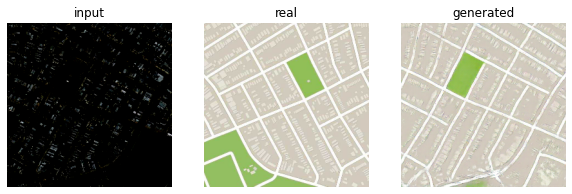

100%|██████████| 69/69 [00:20<00:00,  3.36it/s, D_fake=0.328, D_real=0.565]


Epoch 14


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.419, D_real=0.486]

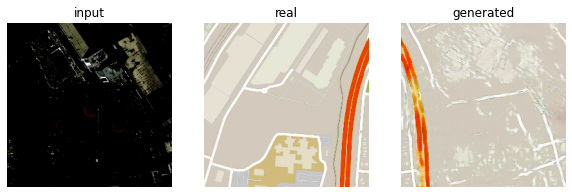

 72%|███████▏  | 50/69 [00:15<00:05,  3.64it/s, D_fake=0.354, D_real=0.61] 

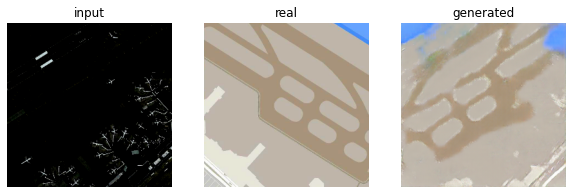

100%|██████████| 69/69 [00:20<00:00,  3.41it/s, D_fake=0.26, D_real=0.731]


Epoch 15


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.447, D_real=0.325]

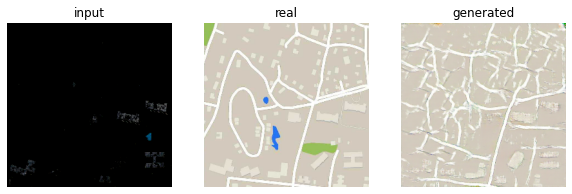

 72%|███████▏  | 50/69 [00:15<00:05,  3.79it/s, D_fake=0.296, D_real=0.589]

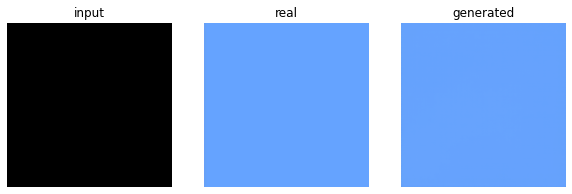

100%|██████████| 69/69 [00:20<00:00,  3.32it/s, D_fake=0.329, D_real=0.839]


Epoch 16


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.409, D_real=0.928]

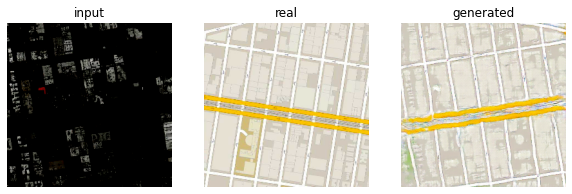

 72%|███████▏  | 50/69 [00:15<00:06,  2.93it/s, D_fake=0.203, D_real=0.714]

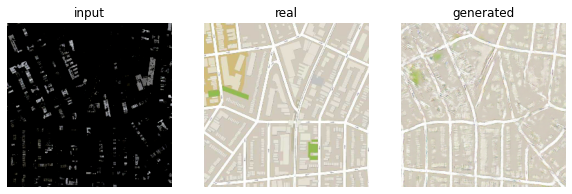

100%|██████████| 69/69 [00:20<00:00,  3.30it/s, D_fake=0.226, D_real=0.663]


Epoch 17


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.303, D_real=0.642]

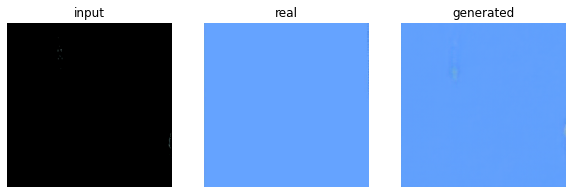

 72%|███████▏  | 50/69 [00:15<00:05,  3.76it/s, D_fake=0.29, D_real=0.774] 

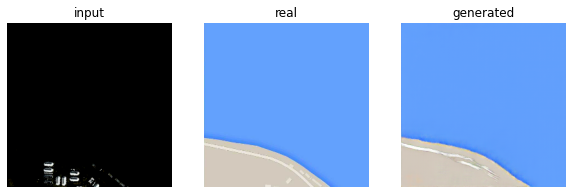

100%|██████████| 69/69 [00:20<00:00,  3.42it/s, D_fake=0.259, D_real=0.752]


Epoch 18


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.273, D_real=0.58]

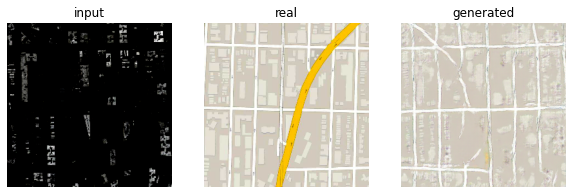

 72%|███████▏  | 50/69 [00:15<00:05,  3.71it/s, D_fake=0.367, D_real=0.45] 

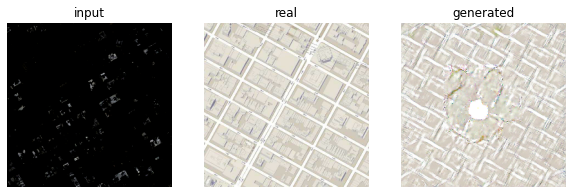

100%|██████████| 69/69 [00:20<00:00,  3.40it/s, D_fake=0.45, D_real=0.536]


Epoch 19


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.351, D_real=0.533]

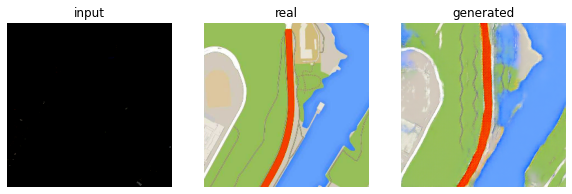

 72%|███████▏  | 50/69 [00:15<00:05,  3.75it/s, D_fake=0.2, D_real=0.431]  

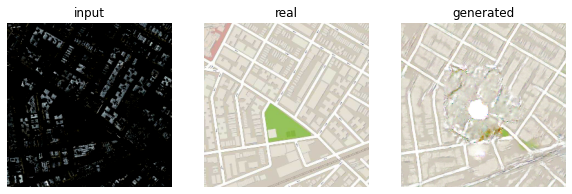

100%|██████████| 69/69 [00:20<00:00,  3.34it/s, D_fake=0.286, D_real=0.878]


Epoch 20


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.214, D_real=0.738]

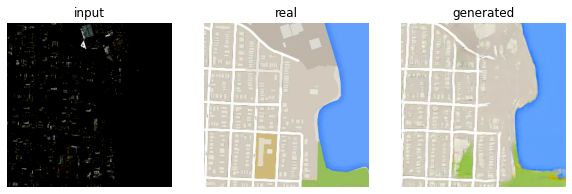

 72%|███████▏  | 50/69 [00:15<00:06,  3.04it/s, D_fake=0.423, D_real=0.707]

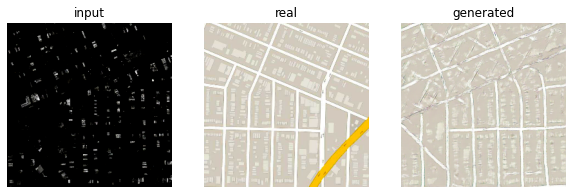

100%|██████████| 69/69 [00:20<00:00,  3.40it/s, D_fake=0.388, D_real=0.895]


=> Saving checkpoint
=> Saving checkpoint
Epoch 21


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.442, D_real=0.65]

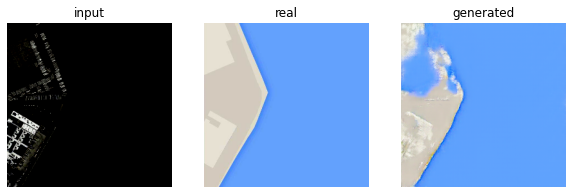

 72%|███████▏  | 50/69 [00:15<00:05,  3.47it/s, D_fake=0.216, D_real=0.69] 

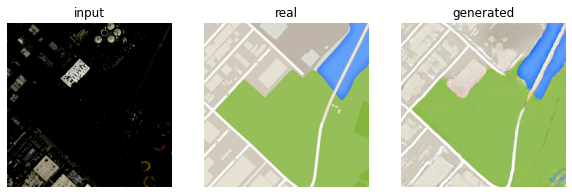

100%|██████████| 69/69 [00:20<00:00,  3.37it/s, D_fake=0.275, D_real=0.901]


Epoch 22


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.691, D_real=0.35]

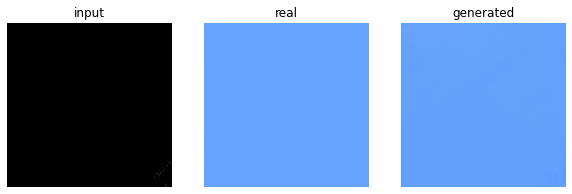

 72%|███████▏  | 50/69 [00:14<00:05,  3.76it/s, D_fake=0.326, D_real=0.595]

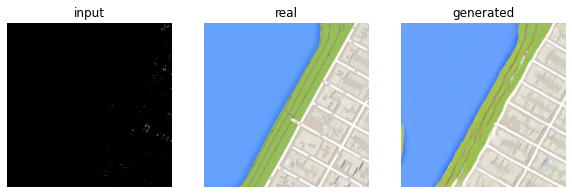

100%|██████████| 69/69 [00:20<00:00,  3.40it/s, D_fake=0.402, D_real=0.771]


Epoch 23


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.357, D_real=0.74]

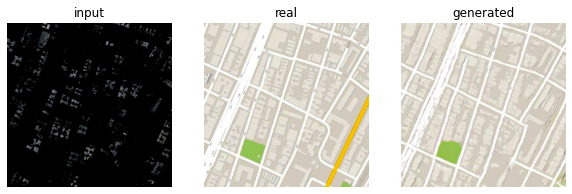

 72%|███████▏  | 50/69 [00:14<00:05,  3.67it/s, D_fake=0.278, D_real=0.83] 

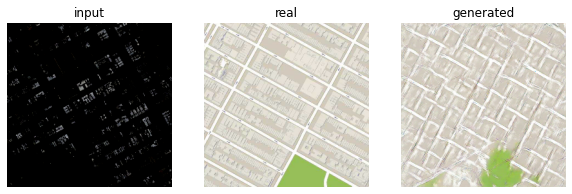

100%|██████████| 69/69 [00:19<00:00,  3.50it/s, D_fake=0.312, D_real=0.926]


Epoch 24


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.422, D_real=0.686]

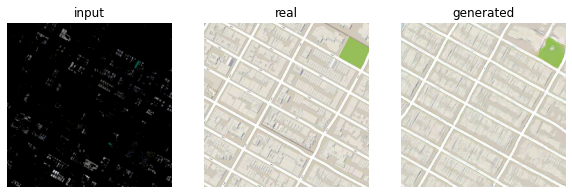

 72%|███████▏  | 50/69 [00:15<00:05,  3.80it/s, D_fake=0.257, D_real=0.643]

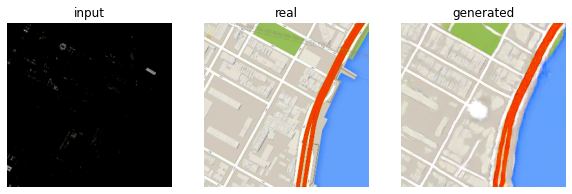

100%|██████████| 69/69 [00:20<00:00,  3.34it/s, D_fake=0.395, D_real=0.525]


Epoch 25


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.203, D_real=0.236]

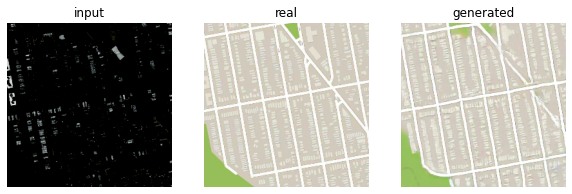

 72%|███████▏  | 50/69 [00:14<00:05,  3.74it/s, D_fake=0.243, D_real=0.792]

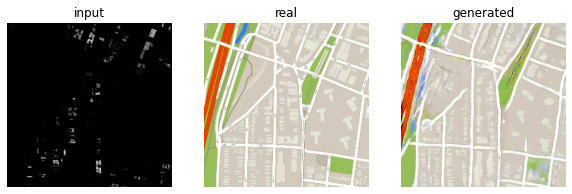

100%|██████████| 69/69 [00:20<00:00,  3.41it/s, D_fake=0.385, D_real=0.456]


Epoch 26


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.273, D_real=0.681]

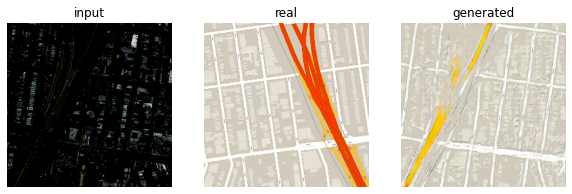

 72%|███████▏  | 50/69 [00:15<00:05,  3.49it/s, D_fake=0.233, D_real=0.511]

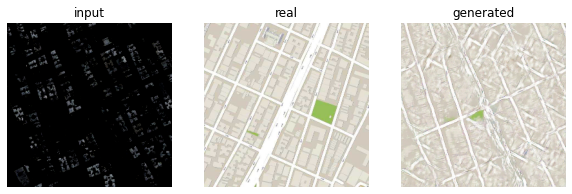

100%|██████████| 69/69 [00:20<00:00,  3.37it/s, D_fake=0.336, D_real=0.778]


Epoch 27


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.241, D_real=0.657]

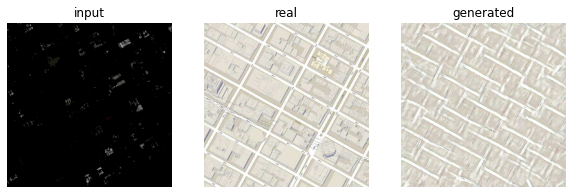

 72%|███████▏  | 50/69 [00:15<00:05,  3.77it/s, D_fake=0.224, D_real=0.733]

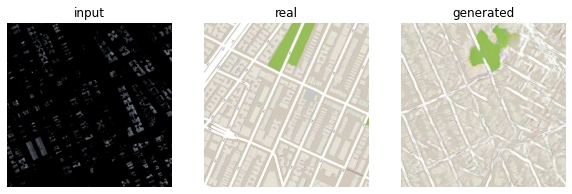

100%|██████████| 69/69 [00:20<00:00,  3.40it/s, D_fake=0.329, D_real=0.786]


Epoch 28


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.259, D_real=0.462]

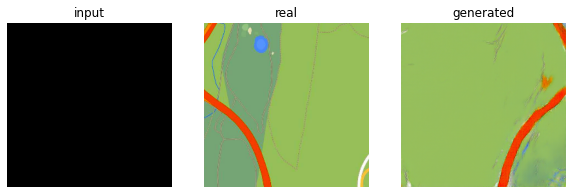

 72%|███████▏  | 50/69 [00:15<00:05,  3.59it/s, D_fake=0.218, D_real=0.66] 

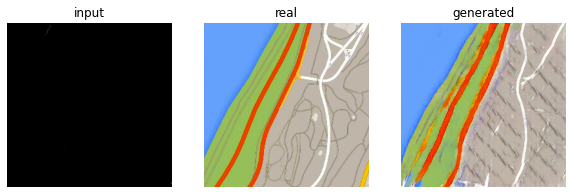

100%|██████████| 69/69 [00:19<00:00,  3.46it/s, D_fake=0.159, D_real=0.705]


Epoch 29


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.203, D_real=0.528]

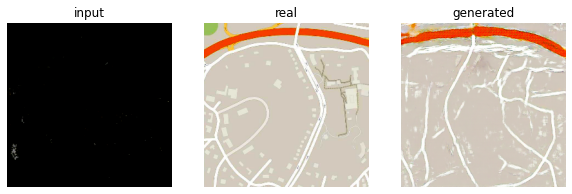

 72%|███████▏  | 50/69 [00:15<00:04,  3.83it/s, D_fake=0.344, D_real=0.716]

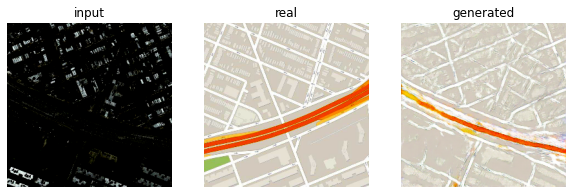

100%|██████████| 69/69 [00:20<00:00,  3.40it/s, D_fake=0.384, D_real=0.541]


Epoch 30


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.459, D_real=0.469]

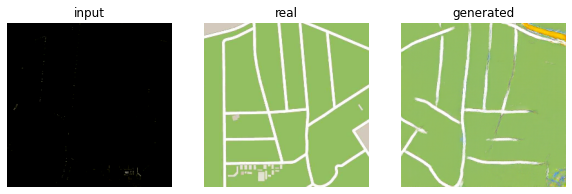

 72%|███████▏  | 50/69 [00:15<00:05,  3.20it/s, D_fake=0.341, D_real=0.756]

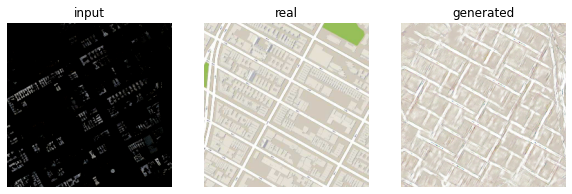

100%|██████████| 69/69 [00:20<00:00,  3.37it/s, D_fake=0.193, D_real=0.849]


Epoch 31


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.672, D_real=0.398]

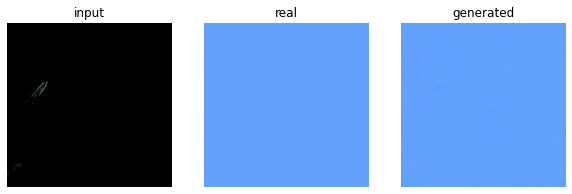

 72%|███████▏  | 50/69 [00:14<00:05,  3.71it/s, D_fake=0.208, D_real=0.966]

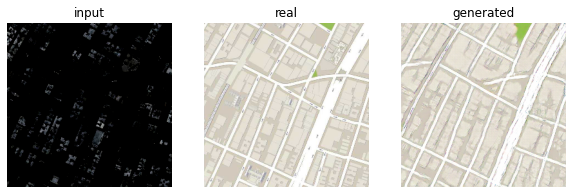

100%|██████████| 69/69 [00:19<00:00,  3.48it/s, D_fake=0.263, D_real=0.663]


Epoch 32


  0%|          | 0/69 [00:01<?, ?it/s, D_fake=0.213, D_real=0.82]

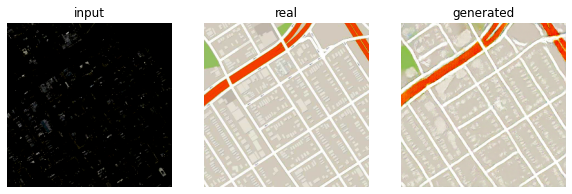

 72%|███████▏  | 50/69 [00:15<00:05,  3.67it/s, D_fake=0.507, D_real=0.504]

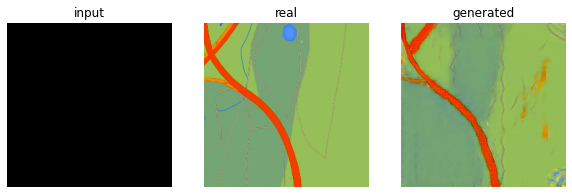

100%|██████████| 69/69 [00:20<00:00,  3.36it/s, D_fake=0.332, D_real=0.825]


Epoch 33


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.21, D_real=0.776]

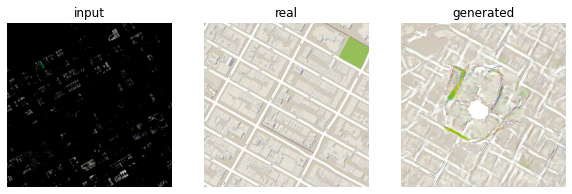

 72%|███████▏  | 50/69 [00:14<00:05,  3.41it/s, D_fake=0.214, D_real=0.723]

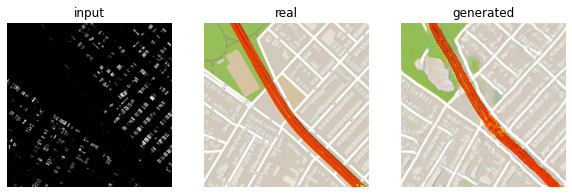

100%|██████████| 69/69 [00:20<00:00,  3.38it/s, D_fake=0.279, D_real=0.659]


Epoch 34


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.319, D_real=0.845]

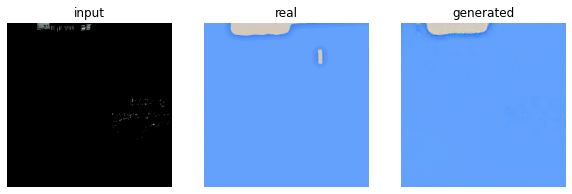

 72%|███████▏  | 50/69 [00:15<00:05,  3.36it/s, D_fake=0.228, D_real=0.656]

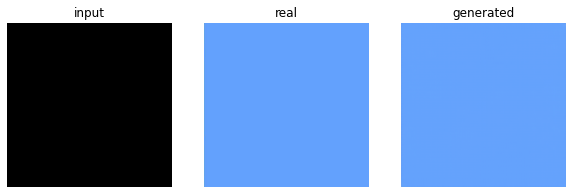

100%|██████████| 69/69 [00:20<00:00,  3.44it/s, D_fake=0.406, D_real=0.724]


Epoch 35


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.317, D_real=0.673]

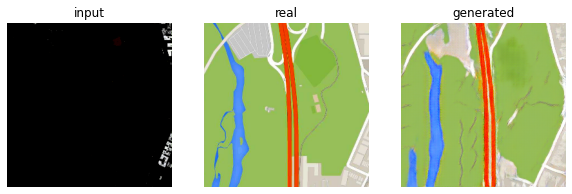

 72%|███████▏  | 50/69 [00:15<00:05,  3.73it/s, D_fake=0.305, D_real=0.73] 

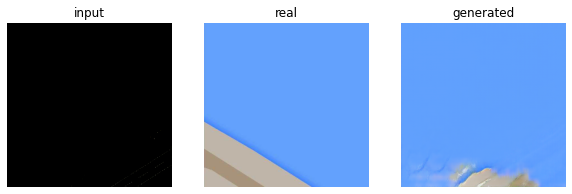

100%|██████████| 69/69 [00:20<00:00,  3.33it/s, D_fake=0.293, D_real=0.645]


Epoch 36


  0%|          | 0/69 [00:00<?, ?it/s, D_fake=0.391, D_real=0.729]

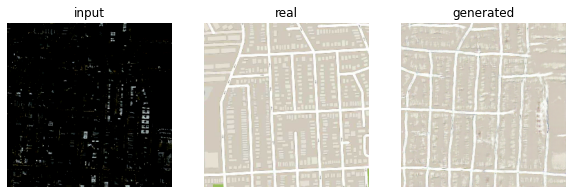

 72%|███████▏  | 50/69 [00:14<00:05,  3.70it/s, D_fake=0.389, D_real=0.645]

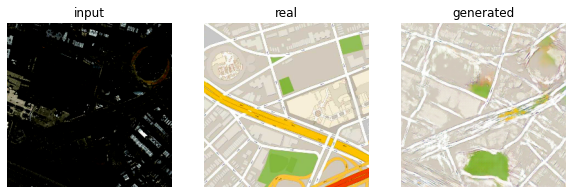

 87%|████████▋ | 60/69 [00:17<00:02,  3.75it/s, D_fake=0.389, D_real=0.645]

In [ ]:
def train_fn(
    disc, gen, loader, opt_disc, opt_gen, l1_loss, bce, g_scaler, d_scaler,
):
    loop = tqdm(loader, leave=True)

    for idx, (x, y) in enumerate(loop):
        x = x.to(DEVICE)
        y = y.to(DEVICE)

        # Train Discriminator
        with torch.cuda.amp.autocast():
            y_fake = gen(x)
            D_real = disc(x, y)
            D_real_loss = bce(D_real, torch.ones_like(D_real))
            D_fake = disc(x, y_fake.detach())
            D_fake_loss = bce(D_fake, torch.zeros_like(D_fake))
            D_loss = (D_real_loss + D_fake_loss) / 2

        disc.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # Train generator
        with torch.cuda.amp.autocast():
            D_fake = disc(x, y_fake)
            G_fake_loss = bce(D_fake, torch.ones_like(D_fake))
            L1 = l1_loss(y_fake, y) * L1_LAMBDA
            G_loss = G_fake_loss + L1

        opt_gen.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        if idx % 10 == 0:
            loop.set_postfix(
                D_real=torch.sigmoid(D_real).mean().item(),
                D_fake=torch.sigmoid(D_fake).mean().item(),
            )
        if idx % 50 == 0:
            display_results(x[0], y[0], y_fake[0], path=f'/kaggle/working/{idx}',figsize=(10,5))


def main():
    disc = Discriminator(in_channels=3).to(DEVICE)
    gen = Generator(in_channels=3).to(DEVICE)
    opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999),)
    opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
    BCE = nn.BCEWithLogitsLoss()
    L1_LOSS = nn.L1Loss()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GEN1, gen, opt_gen, LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_DISC1, disc, opt_disc, LEARNING_RATE,
        )

    train_dataset = MapDataset(root_dir=TRAIN_DIR)
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
    )
    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()
    val_dataset = MapDataset(root_dir=VAL_DIR)
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

    for epoch in range(NUM_EPOCHS):
        print(f'Epoch {epoch}')
        train_fn(
            disc, gen, train_loader, opt_disc, opt_gen, L1_LOSS, BCE, g_scaler, d_scaler,
        )

        if SAVE_MODEL and epoch % 20 == 0:
            save_checkpoint(gen, opt_gen, filename=CHECKPOINT_GEN)
            save_checkpoint(disc, opt_disc, filename=CHECKPOINT_DISC)
            

if __name__ == "__main__":
    main()